## 1. 데이터 로드

데이터가 json 형식이기에 key-value로 접근해야한다.

->참고 : https://cvml.tistory.com/21

In [ ]:
import urllib.request
from PIL import Image

In [ ]:
import json

FILE_PATH = "/content/drive/MyDrive/학교 계정/프로그래밍 언어 공부 자료/인공지능/BOAZ 18기/ADV 방학/ADV 방학 세션/GAN 공부 실습/sketch2fashion/FEIDEGGER_release_1.2.json"
file = json.load(open(FILE_PATH))
file[0]["url"]

'https://img01.ztat.net/article/spp-media-p1/3c8812d8b6233a55a5da06b19d780302/dc58460c157b426b817f13e7a2f087c5.jpg?imwidth=400&filter=packshot'

In [ ]:
image = [i["url"] for i in file ]
image

['https://img01.ztat.net/article/spp-media-p1/3c8812d8b6233a55a5da06b19d780302/dc58460c157b426b817f13e7a2f087c5.jpg?imwidth=400&filter=packshot',
 'https://img01.ztat.net/article/spp-media-p1/16fe0f2da2cd3335afd980155126a92a/c70b2f32a4e844c59796917b811be831.jpg?imwidth=400&filter=packshot',
 'https://img01.ztat.net/article/spp-media-p1/590fc08629c33ffcbb64b8a53847340f/9d83a9a8214a43a1956c9912aa4a6256.jpg?imwidth=400&filter=packshot',
 'https://img01.ztat.net/article/spp-media-p1/1a39011707553a40af6283e7316ddf21/0ad3e2d9eed44ea6b2884c97773ce3b3.jpg?imwidth=400&filter=packshot',
 'https://img01.ztat.net/article/spp-media-p1/b0bbc3d60f03359db1769cb1518e7295/1297b4e0a7534fac940cca13cac3f4c7.jpg?imwidth=400&filter=packshot',
 'https://img01.ztat.net/article/spp-media-p1/7987bd8f609e3c9281ee78b6407cb484/36e6252acced42e5ae4ad0586c4c0b86.jpg?imwidth=400&filter=packshot',
 'https://img01.ztat.net/article/spp-media-p1/35af95bc713b3b5e81271efb768824cb/1729533d161c48a2accf176cec87c1d2.jpg?imwidth=

## 이미지 다운

->참고 : https://soyoung-new-challenge.tistory.com/92

In [ ]:
cd /content

/content


In [ ]:
# 이미지 다운로드
!pwd

/content


In [ ]:
!mkdir trainB

In [ ]:
# edge 이미지 담을 폴더
!mkdir trainA

In [ ]:
cd ./trainB

/content/trainB


In [ ]:
def save_img():
  i = 1
  for url in image:
    i += 1
    urllib.request.urlretrieve(url, f"test{i}.jpg")

In [ ]:
save_img()

# 2. edge detection

-> 채색에서 한 것 적용

In [ ]:
import cv2

def detect_edges(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_gray = cv2.bilateralFilter(img_gray, 5, 50, 50)
    img_gray_edges = cv2.Canny(img_gray, 45, 100)
    img_gray_edges = cv2.bitwise_not(img_gray_edges) # invert black/white
    img_edges = cv2.cvtColor(img_gray_edges, cv2.COLOR_GRAY2RGB)
    
    return img_edges

In [ ]:
import glob
import os
from keras_preprocessing.image import load_img, save_img
import numpy as np


# 이미지를 가져와서 target 폴더에 저장하는 함수 2개
def create_edge_imgs(target_dir, source_dir):
    pathname = f'{target_dir}/*.jpg' # target_dir에 폴더명
    for filepath in glob.glob(pathname):
        img_target = load_img(filepath, target_size=(256, 256))
        img_target = np.array(img_target)
        img_source = detect_edges(img_target) 

        filename = os.path.basename(filepath)
        img_source_filepath = os.path.join(source_dir, filename)
        save_img(img_source_filepath, img_source) 

In [ ]:
pwd

'/content/trainB'

In [ ]:
# 원본 이미지 폴더 경로, 엣지 이미지를 저장할 폴더 경로
create_edge_imgs("/content/trainB", "/content/trainA")

In [ ]:
cd /content

/content


# 3. cyclegan 훈련

In [ ]:
!mkdir datasets

In [ ]:
!mkdir ./datasets/sketch2fashion

In [ ]:
mv ./trainA ./datasets/sketch2fashion

In [ ]:
mv ./trainB ./datasets/sketch2fashion

In [ ]:
!mkdir ./datasets/sketch2fashion/testA

In [ ]:
!mkdir ./datasets/sketch2fashion/testB

In [ ]:
!cp -r ./datasets/sketch2fashion/trainA/test7* ./datasets/sketch2fashion/testA

In [ ]:
!cp -r ./datasets/sketch2fashion/trainB/test7* ./datasets/sketch2fashion/testB

In [ ]:
import scipy
import imageio
from skimage.transform import resize
from glob import glob
import numpy as np

class DataLoader():
    def __init__(self, dataset_name, img_res=(128, 128)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, domain, batch_size=1, is_testing=False):
        data_type = "train%s" % domain if not is_testing else "test%s" % domain
        path = glob('./datasets/%s/%s/*' % (self.dataset_name, data_type))

        batch_images = np.random.choice(path, size=batch_size)

        imgs = []
        for img_path in batch_images:
            img = self.imread(img_path)
            if not is_testing:
                img = resize(img, self.img_res)

                if np.random.random() > 0.5:
                    img = np.fliplr(img)
            else:
                img = resize(img, self.img_res)
            imgs.append(img)

        imgs = np.array(imgs)/127.5 - 1.

        return imgs

    def load_batch(self, batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "val"
        path_A = glob('./datasets/%s/%sA/*' % (self.dataset_name, data_type))
        path_B = glob('./datasets/%s/%sB/*' % (self.dataset_name, data_type))

        self.n_batches = int(min(len(path_A), len(path_B)) / batch_size)
        total_samples = self.n_batches * batch_size

        # Sample n_batches * batch_size from each path list so that model sees all
        # samples from both domains
        path_A = np.random.choice(path_A, total_samples, replace=False)
        path_B = np.random.choice(path_B, total_samples, replace=False)

        for i in range(self.n_batches-1):
            batch_A = path_A[i*batch_size:(i+1)*batch_size]
            batch_B = path_B[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img_A, img_B in zip(batch_A, batch_B):
                img_A = self.imread(img_A)
                img_B = self.imread(img_B)

                img_A = resize(img_A, self.img_res)
                img_B = resize(img_B, self.img_res)

                if not is_testing and np.random.random() > 0.5:
                        img_A = np.fliplr(img_A)
                        img_B = np.fliplr(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

    def imread(self, path):
        return imageio.imread(path, pilmode='RGB').astype(np.float)

In [ ]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 13.2 MB/s 


In [ ]:
from __future__ import print_function, division
import scipy
from tensorflow.keras.datasets import mnist
from tensorflow_addons.layers import InstanceNormalization
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os

In [ ]:
class CycleGAN():
    def __init__(self):
        # 입력 크기
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # 데이터 로더 설정
        self.dataset_name = 'sketch2fashion'
        # DataLoader 객체를 사용해 전처리된 데이터 임포트
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))

        # D(PatchGAN)의 출력 크기를 계산 -> 계산대로면 8
        patch = int(self.img_rows / 2**4)
        self.disc_patch = (patch, patch, 1) # 계산대로면 8, 8, 1

        # G와 D의 첫 번째 층에 있는 필터의 개수
        self.gf = 32
        self.df = 64

        # 손실 가중치
        self.lambda_cycle = 10.0                    # 사이클-일관성 손실
        self.lambda_id = 0.9 * self.lambda_cycle    # 동일성 손실

        optimizer = Adam(0.0002, 0.5)
        
        # 판별자를 만들고 컴파일
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])
        self.d_B.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])

        # 생성자
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # 두 도메인의 입력 이미지 -> ①, ② 두 번 들어감
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # 이미지를 다른 도메인으로 변환 ①여기
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # 원본 도메인으로 이미지를 다시 변환
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # 동일한 이미지 매핑 ② 여기
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)

        # 연결 모델에서는 생성자만 훈련
        self.d_A.trainable = False
        self.d_B.trainable = False

        # 판별자가 변환된 이미지를 검증
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # 연결 모델은 판별자를 속이기 위한 생성자를 훈련합니다.
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[valid_A, valid_B, #판별자의 적대 손실을 위한 출력
                                       reconstr_A, reconstr_B,#재구성을 위한 출력 
                                       img_A_id, img_B_id]) #동일성 손실을 위한 출력

        # 출력의 각 3개의 손실 값
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              loss_weights=[1, 1,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id],
                              optimizer=optimizer)

In [ ]:
class CycleGAN(CycleGAN):
      @staticmethod
      def conv2d(layer_input, filters, f_size=4, normalization=True):
        """다운샘플링하는 동안 사용되는 층"""
        d = Conv2D(filters, kernel_size=f_size,
                   strides=2, padding='same')(layer_input)
        d = LeakyReLU(alpha=0.2)(d)
        if normalization:
            d = InstanceNormalization()(d)
        return d
      
      @staticmethod
      def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
            """업샘플링하는 동안 사용되는 층"""
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(filters, kernel_size=f_size, strides=1,
                       padding='same', activation='relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Concatenate()([u, skip_input])
            return u

In [ ]:
class CycleGAN(CycleGAN):
    def build_generator(self):
        """U-Net 생성자"""
        # 이미지 입력
        d0 = Input(shape=self.img_shape)

        # 다운샘플링
        d1 = self.conv2d(d0, self.gf)
        d2 = self.conv2d(d1, self.gf * 2)
        d3 = self.conv2d(d2, self.gf * 4)
        d4 = self.conv2d(d3, self.gf * 8)

        # 업샘플링
        # (d4=그냥 d4입력, d3 = 스킵커넥션)
        u1 = self.deconv2d(d4, d3, self.gf * 4)
        u2 = self.deconv2d(u1, d2, self.gf * 2)
        u3 = self.deconv2d(u2, d1, self.gf)

        u4 = UpSampling2D(size=2)(u3)
        output_img = Conv2D(self.channels, kernel_size=4,
                            strides=1, padding='same', activation='tanh')(u4)

        return Model(d0, output_img)

In [ ]:
class CycleGAN(CycleGAN):
    def build_discriminator(self):
      img = Input(shape=self.img_shape)

      d1 = self.conv2d(img, self.df, normalization=False) #필터 개수를 두배씩 늘린다.
      d2 = self.conv2d(d1, self.df * 2)
      d3 = self.conv2d(d2, self.df * 4)
      d4 = self.conv2d(d3, self.df * 8)

      validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

      return Model(img, validity)

In [ ]:
class CycleGAN(CycleGAN):
      def sample_images(self, epoch, batch_i):
        r, c = 2, 3

        imgs_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        imgs_B = self.data_loader.load_data(domain="B", batch_size=1, is_testing=True)
        
        # 이미지를 다른 도메인으로 변환
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # 원본 도메인으로 되돌린다.
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

        # 이미지를 0 - 1 사이로 스케일을 바꿈
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("images/%s/%d_%d.png" % (self.dataset_name, epoch, batch_i))
        plt.show()

In [ ]:
class CycleGAN(CycleGAN):
      def train(self, epochs, batch_size=1, sample_interval=50):
        # 적대 손실에 대한 정답
        valid = np.ones((batch_size,) + self.disc_patch) # 1
        fake = np.zeros((batch_size,) + self.disc_patch) # 0


        for epoch in range(epochs):
          # 각 도메인에서 랜덤한 이미지의 미니배치를 만듬
            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size)):


                #  판별자 훈련
                # 이미지를 상대 도메인으로 변환

                #생성자 gab를 사용해 이미지a를 b로 변환하고 gba를 사용해 이미지 b를 도메인 a로 변환
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)



                # 판별자를 훈련 (원본 이미지 = real / 변환된 이미지 = fake)
                #da에 실제 이미지a를 1로 알려주고 손실을 구함
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                #gba가 만든 가짜이미지를 0으로 알려줘서 손실을 구함
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                # 이 두 손실을 더함
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)


                # dB에도 똑같이 함
                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # 위에 두 단계에서 나온 손실을 더해서 판별자 전체 손실 생성
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                #  생성자 훈련
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B],
                                                      [valid, valid,
                                                       imgs_A, imgs_B,
                                                       imgs_A, imgs_B])

                if batch_i % sample_interval == 0:
                    self.sample_images(epoch, batch_i)

In [ ]:
!pwd

/content


In [ ]:
mkdir images/sketch2fashion

<ipython-input-24-bddd9fd174e9>:71: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return imageio.imread(path, pilmode='RGB').astype(np.float)


2/2 [==============================] - 0s 36ms/step


2/2 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 16ms/step


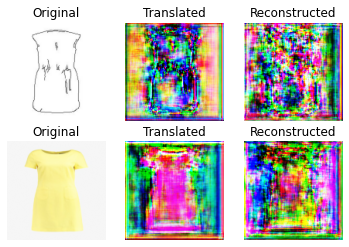

1/1 [==============================] - 0s 18ms/step


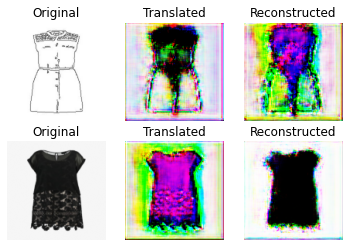

1/1 [==============================] - 0s 16ms/step


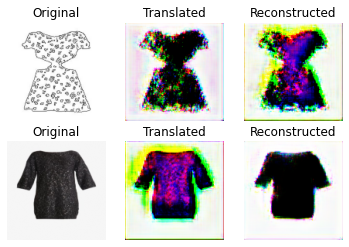

1/1 [==============================] - 0s 16ms/step


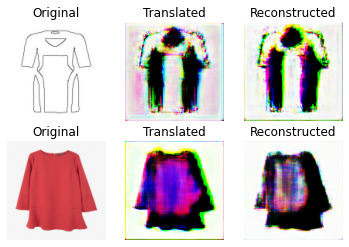

1/1 [==============================] - 0s 15ms/step


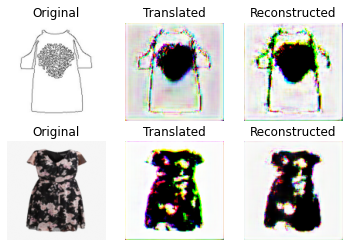

1/1 [==============================] - 0s 15ms/step


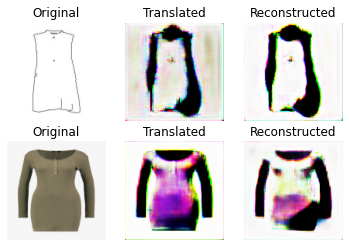

1/1 [==============================] - 0s 15ms/step


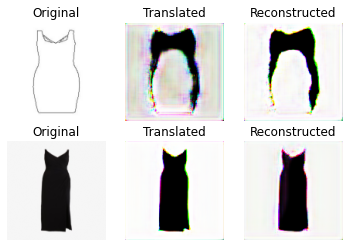

1/1 [==============================] - 0s 19ms/step


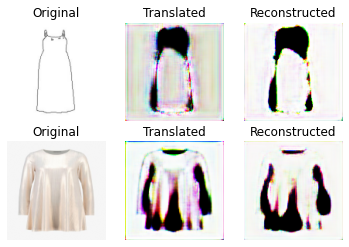

1/1 [==============================] - 0s 16ms/step


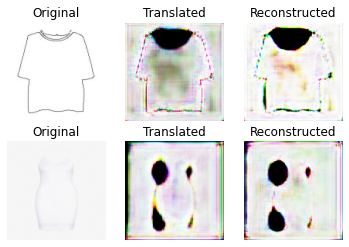

1/1 [==============================] - 0s 22ms/step


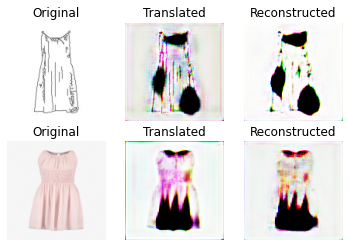

1/1 [==============================] - 0s 15ms/step


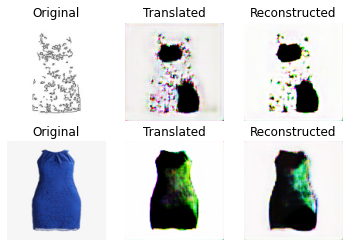

1/1 [==============================] - 0s 17ms/step


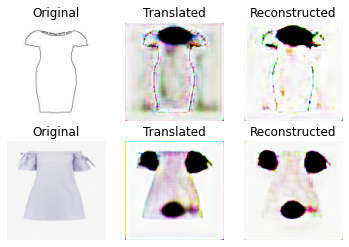

1/1 [==============================] - 0s 16ms/step


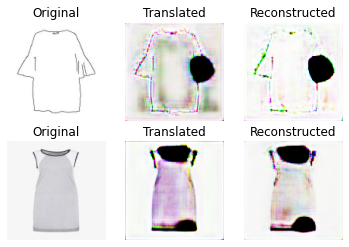

1/1 [==============================] - 0s 20ms/step


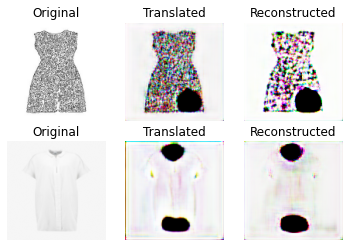

1/1 [==============================] - 0s 19ms/step


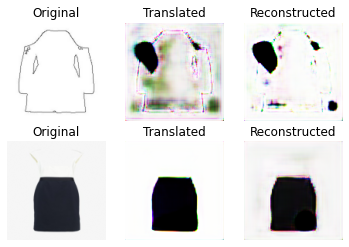

1/1 [==============================] - 0s 17ms/step


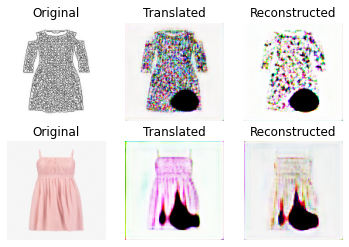

1/1 [==============================] - 0s 25ms/step


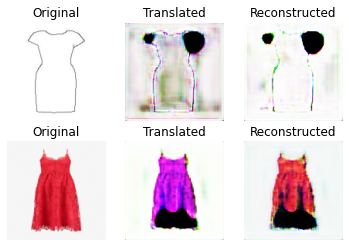

1/1 [==============================] - 0s 21ms/step


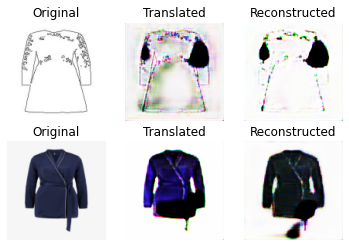

1/1 [==============================] - 0s 20ms/step


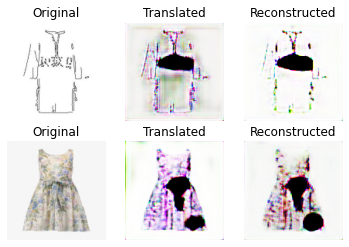

1/1 [==============================] - 0s 21ms/step


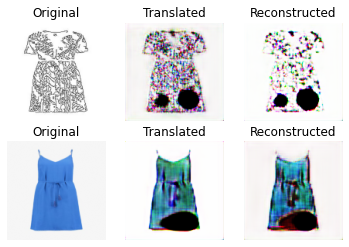

1/1 [==============================] - 0s 23ms/step


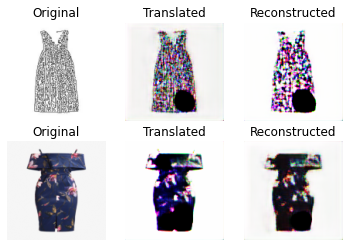

1/1 [==============================] - 0s 19ms/step


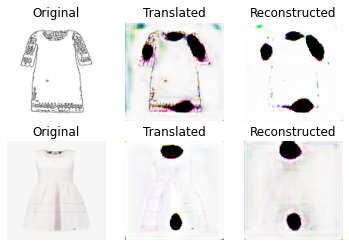

1/1 [==============================] - 0s 19ms/step


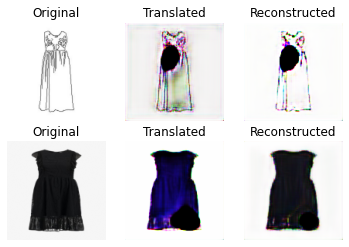

1/1 [==============================] - 0s 18ms/step


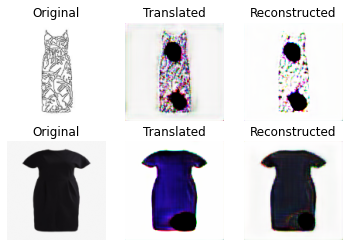

1/1 [==============================] - 0s 23ms/step


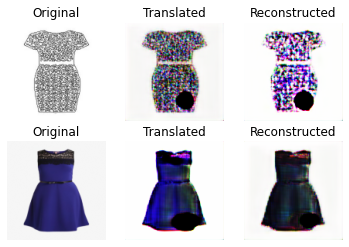

1/1 [==============================] - 0s 21ms/step


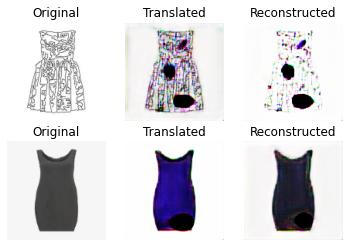

1/1 [==============================] - 0s 18ms/step


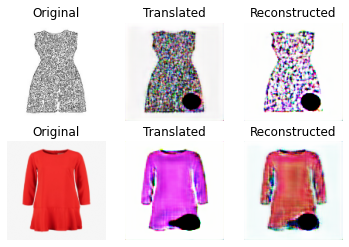

1/1 [==============================] - 0s 22ms/step


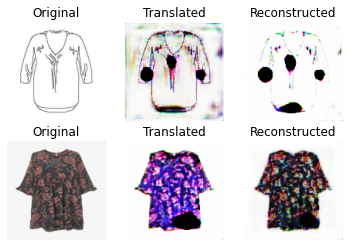

1/1 [==============================] - 0s 22ms/step


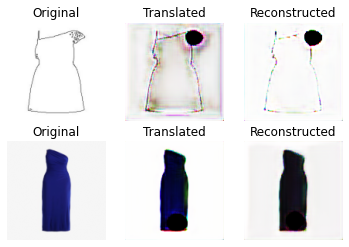

1/1 [==============================] - 0s 21ms/step


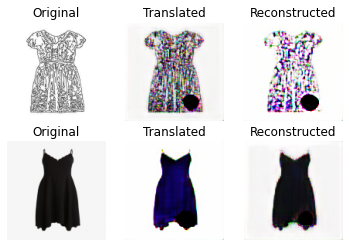

1/1 [==============================] - 0s 29ms/step


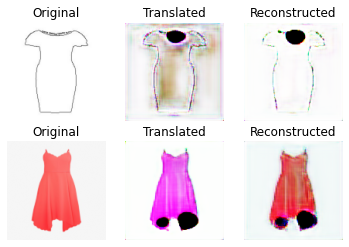

1/1 [==============================] - 0s 32ms/step


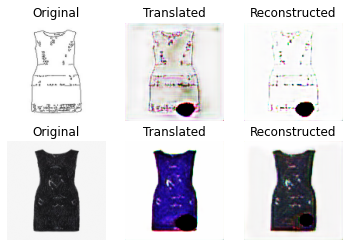

1/1 [==============================] - 0s 25ms/step


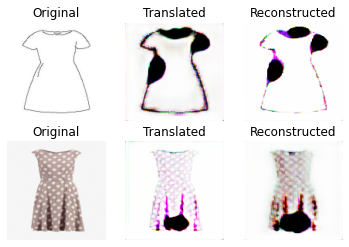

1/1 [==============================] - 0s 24ms/step


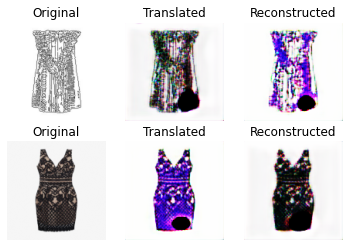

1/1 [==============================] - 0s 32ms/step


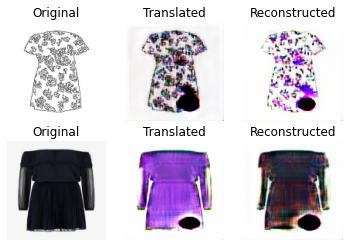

1/1 [==============================] - 0s 24ms/step


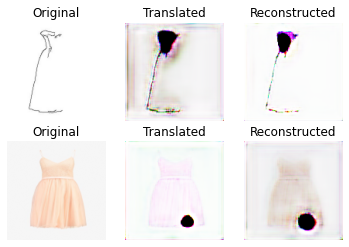

1/1 [==============================] - 0s 21ms/step


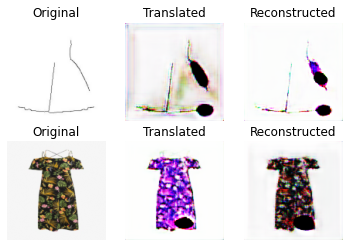

1/1 [==============================] - 0s 24ms/step


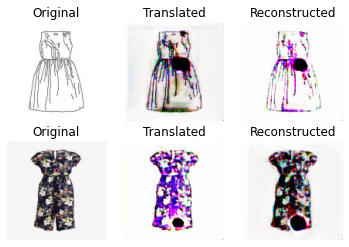

1/1 [==============================] - 0s 22ms/step


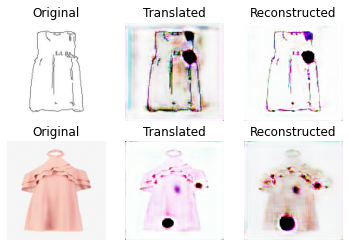

1/1 [==============================] - 0s 21ms/step


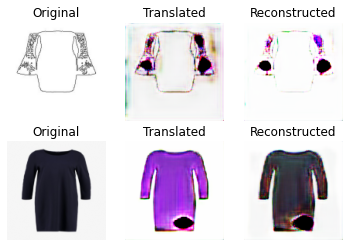

1/1 [==============================] - 0s 22ms/step


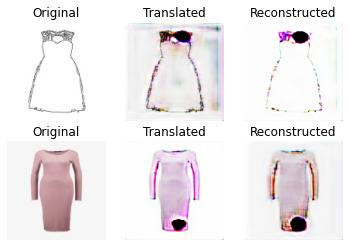

1/1 [==============================] - 0s 24ms/step


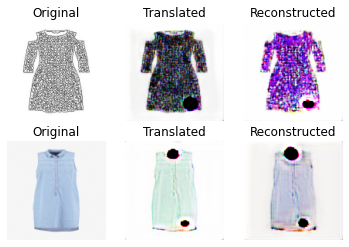

1/1 [==============================] - 0s 27ms/step


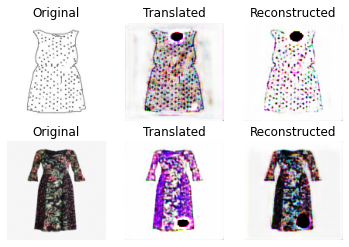

1/1 [==============================] - 0s 23ms/step


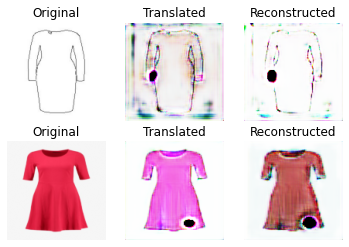

1/1 [==============================] - 0s 23ms/step


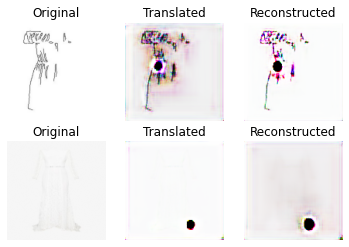

1/1 [==============================] - 0s 21ms/step


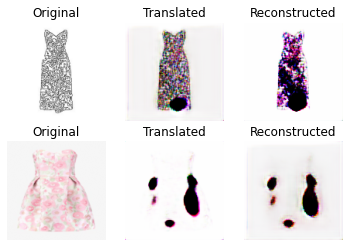

1/1 [==============================] - 0s 23ms/step


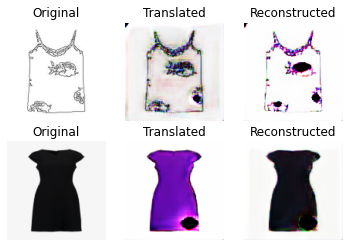

1/1 [==============================] - 0s 26ms/step


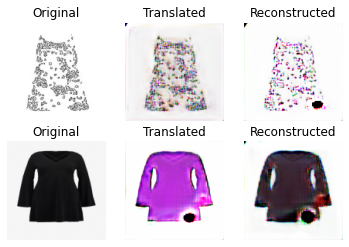

1/1 [==============================] - 0s 25ms/step


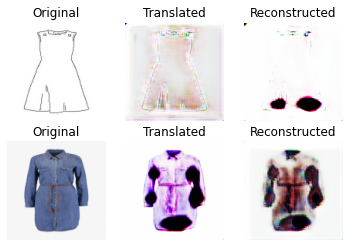

1/1 [==============================] - 0s 21ms/step


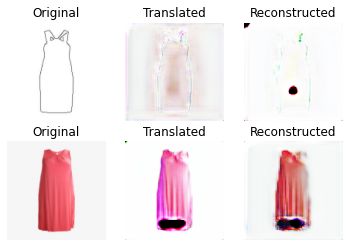

1/1 [==============================] - 0s 23ms/step


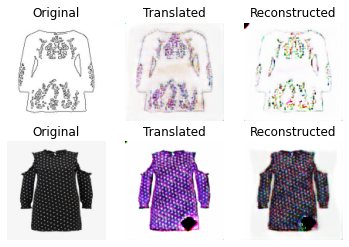

1/1 [==============================] - 0s 23ms/step


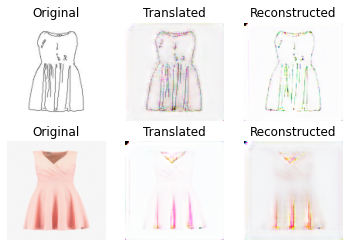

1/1 [==============================] - 0s 26ms/step


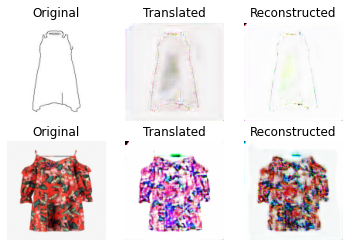

1/1 [==============================] - 0s 25ms/step


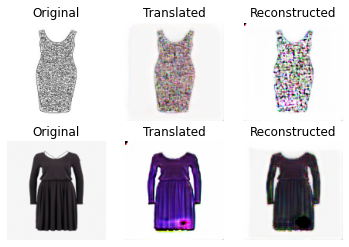

1/1 [==============================] - 0s 23ms/step


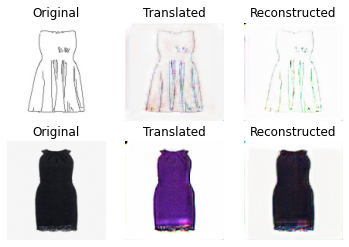

1/1 [==============================] - 0s 22ms/step


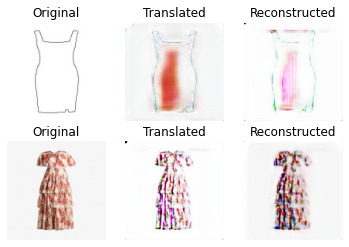

1/1 [==============================] - 0s 25ms/step


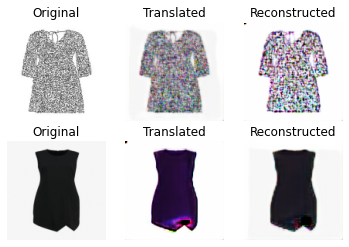

1/1 [==============================] - 0s 23ms/step


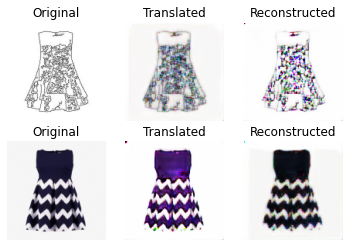

1/1 [==============================] - 0s 23ms/step


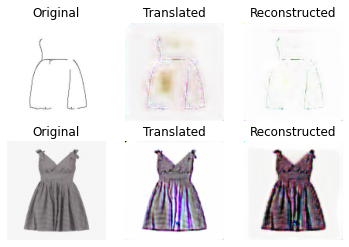

1/1 [==============================] - 0s 22ms/step


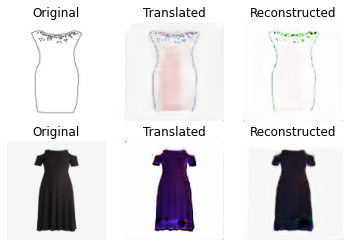

1/1 [==============================] - 0s 20ms/step


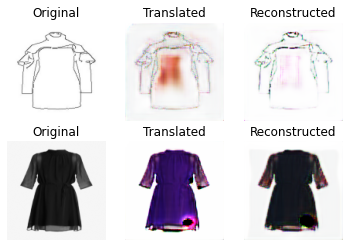

1/1 [==============================] - 0s 22ms/step


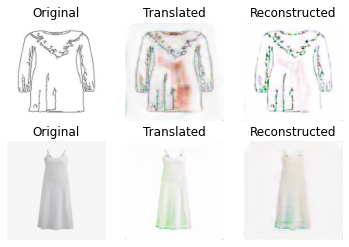

1/1 [==============================] - 0s 25ms/step


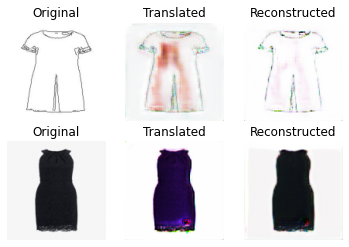

1/1 [==============================] - 0s 22ms/step


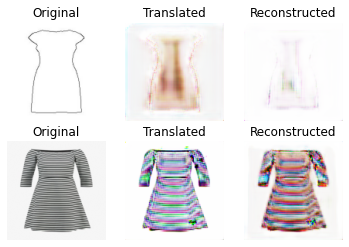

1/1 [==============================] - 0s 22ms/step


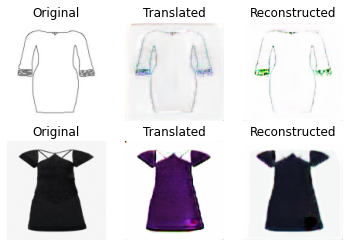

1/1 [==============================] - 0s 23ms/step


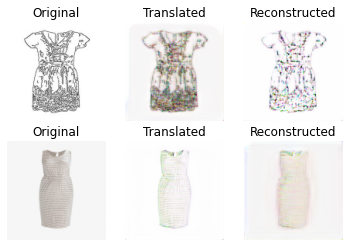

1/1 [==============================] - 0s 25ms/step


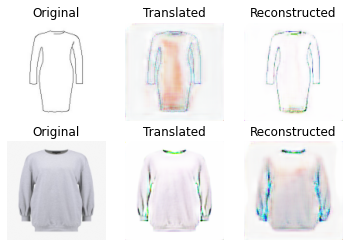

1/1 [==============================] - 0s 24ms/step


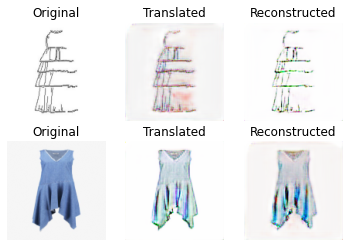

1/1 [==============================] - 0s 22ms/step


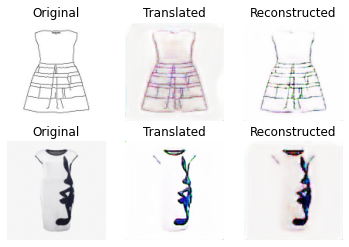

1/1 [==============================] - 0s 22ms/step


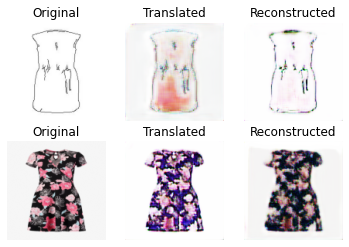

1/1 [==============================] - 0s 25ms/step


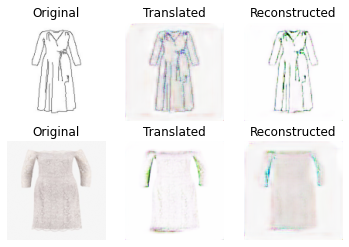

1/1 [==============================] - 0s 24ms/step


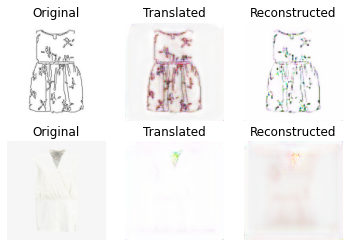

1/1 [==============================] - 0s 21ms/step


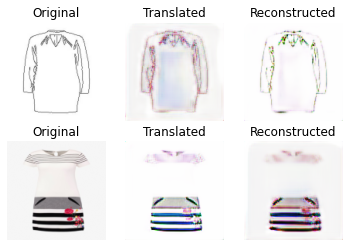

1/1 [==============================] - 0s 22ms/step


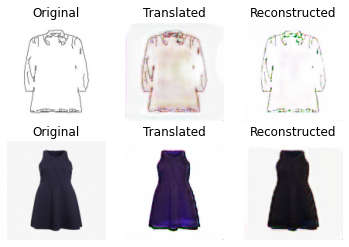

1/1 [==============================] - 0s 22ms/step


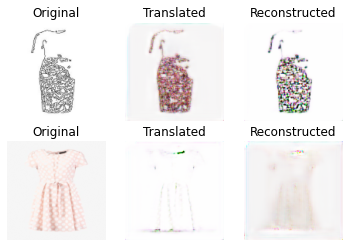

1/1 [==============================] - 0s 25ms/step


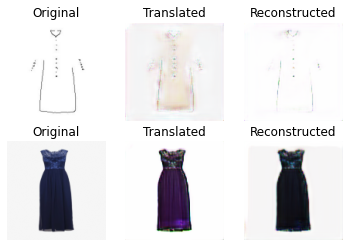

1/1 [==============================] - 0s 22ms/step


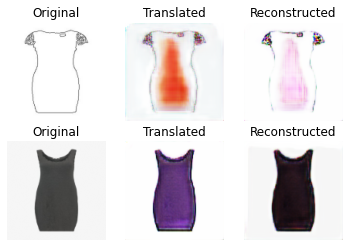

1/1 [==============================] - 0s 22ms/step


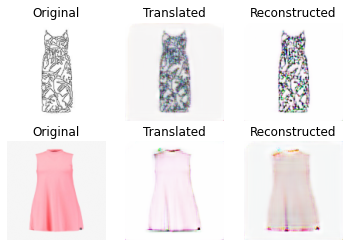

1/1 [==============================] - 0s 28ms/step


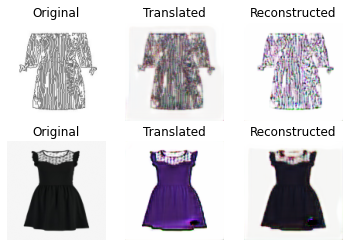

1/1 [==============================] - 0s 23ms/step


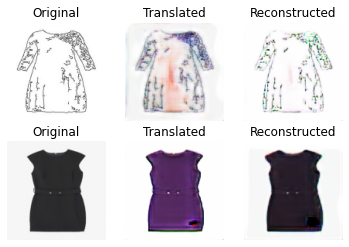

1/1 [==============================] - 0s 22ms/step


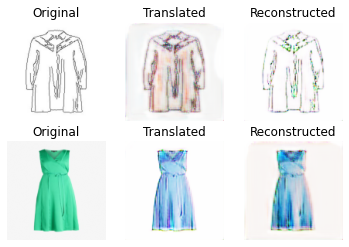

1/1 [==============================] - 0s 26ms/step


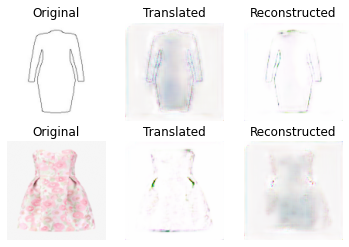

1/1 [==============================] - 0s 25ms/step


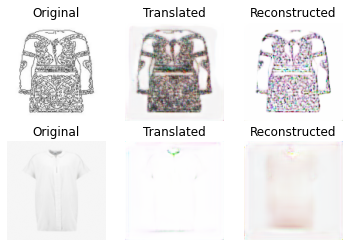

1/1 [==============================] - 0s 21ms/step


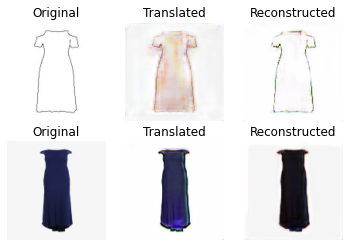

1/1 [==============================] - 0s 22ms/step


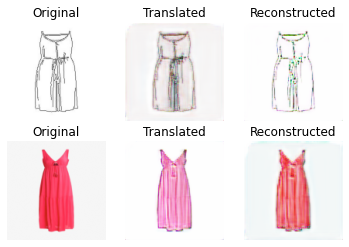

1/1 [==============================] - 0s 27ms/step


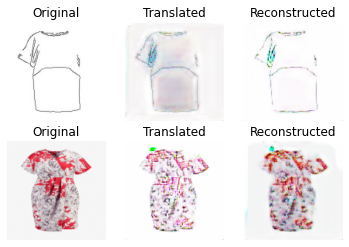

1/1 [==============================] - 0s 22ms/step


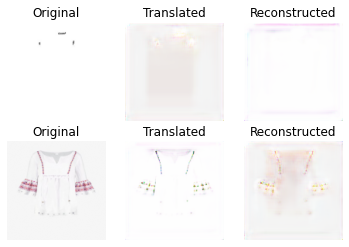

1/1 [==============================] - 0s 23ms/step


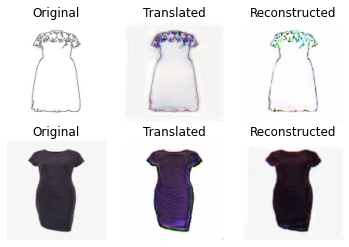

1/1 [==============================] - 0s 22ms/step


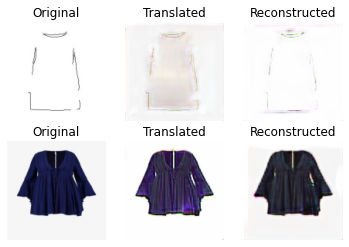

1/1 [==============================] - 0s 21ms/step


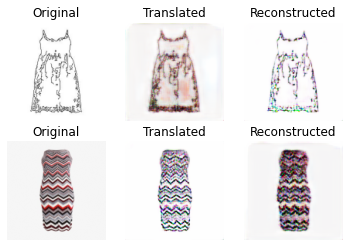

1/1 [==============================] - 0s 25ms/step


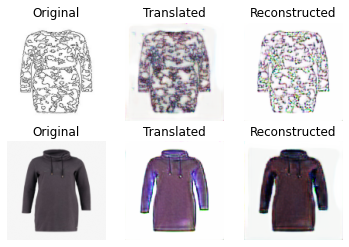

1/1 [==============================] - 0s 21ms/step


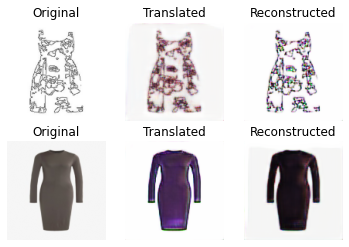

1/1 [==============================] - 0s 25ms/step


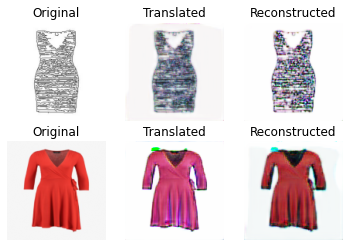

1/1 [==============================] - 0s 24ms/step


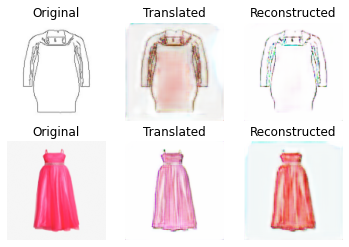

1/1 [==============================] - 0s 21ms/step


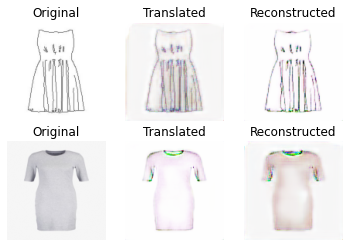

1/1 [==============================] - 0s 25ms/step


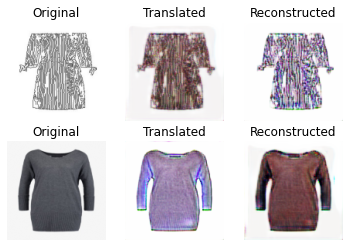

1/1 [==============================] - 0s 23ms/step


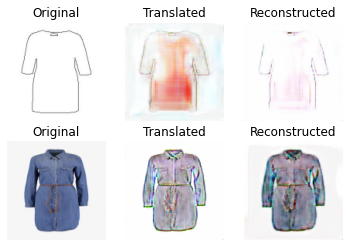

1/1 [==============================] - 0s 28ms/step


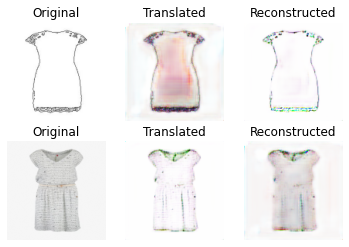

1/1 [==============================] - 0s 22ms/step


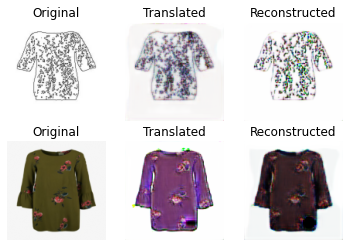

1/1 [==============================] - 0s 22ms/step


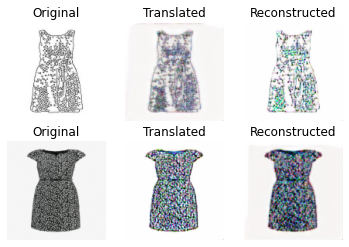

1/1 [==============================] - 0s 22ms/step


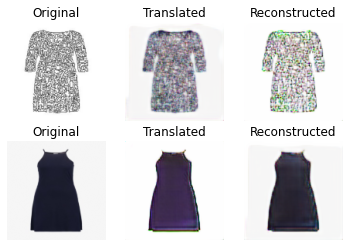

1/1 [==============================] - 0s 22ms/step


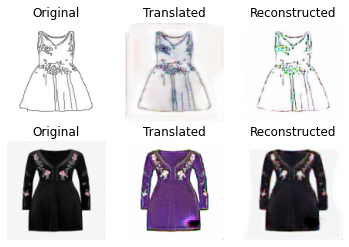

1/1 [==============================] - 0s 33ms/step


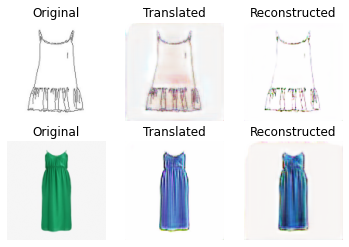

1/1 [==============================] - 0s 23ms/step


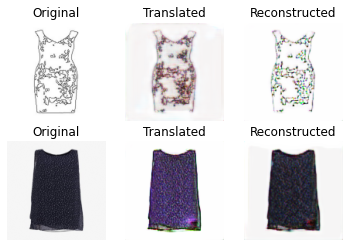

1/1 [==============================] - 0s 23ms/step


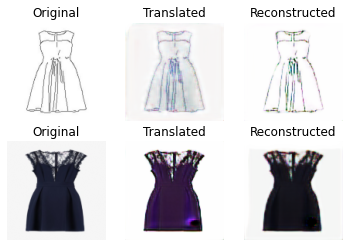

1/1 [==============================] - 0s 22ms/step


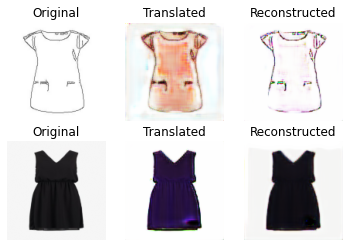

1/1 [==============================] - 0s 21ms/step


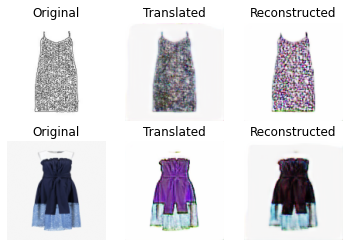

1/1 [==============================] - 0s 27ms/step


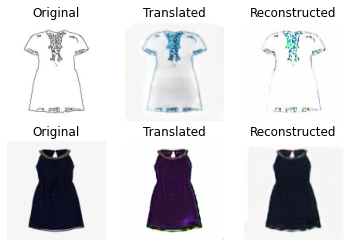

1/1 [==============================] - 0s 22ms/step


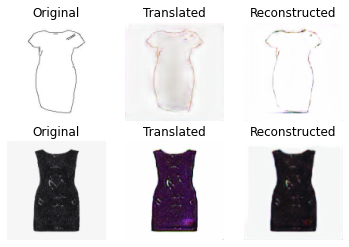

1/1 [==============================] - 0s 24ms/step


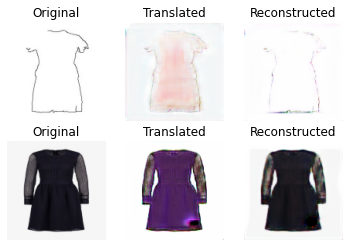

1/1 [==============================] - 0s 21ms/step


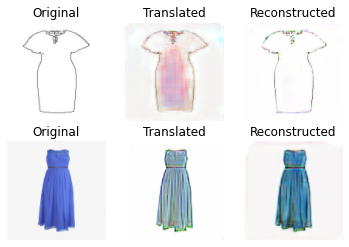

1/1 [==============================] - 0s 21ms/step


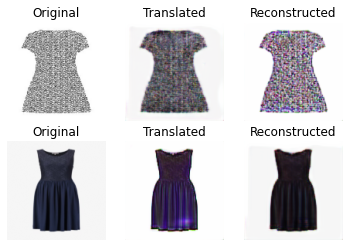

1/1 [==============================] - 0s 21ms/step


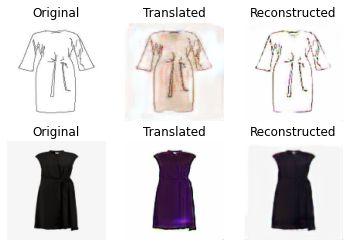

1/1 [==============================] - 0s 21ms/step


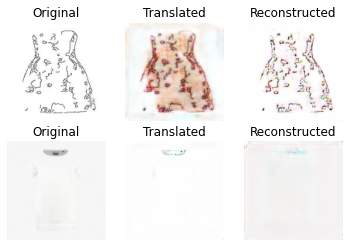

1/1 [==============================] - 0s 24ms/step


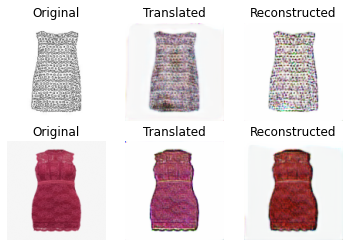

1/1 [==============================] - 0s 22ms/step


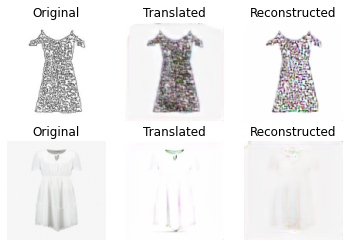

1/1 [==============================] - 0s 23ms/step


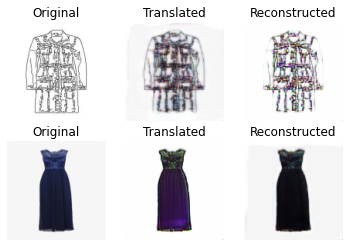

1/1 [==============================] - 0s 25ms/step


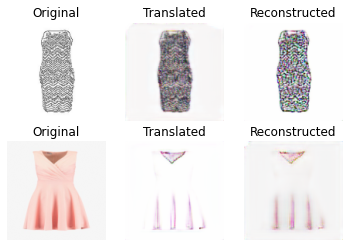

1/1 [==============================] - 0s 25ms/step


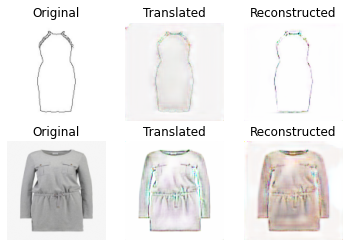

1/1 [==============================] - 0s 22ms/step


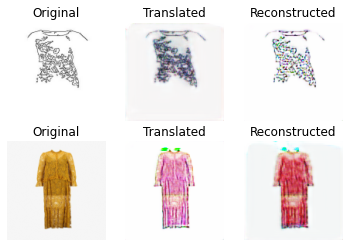

1/1 [==============================] - 0s 22ms/step


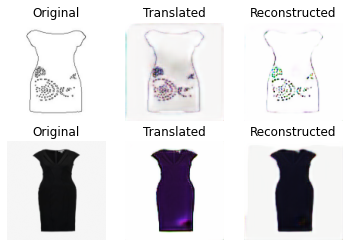

1/1 [==============================] - 0s 20ms/step


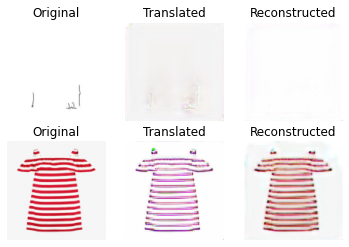

1/1 [==============================] - 0s 22ms/step


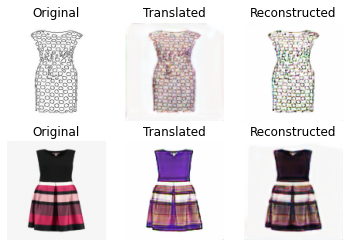

1/1 [==============================] - 0s 25ms/step


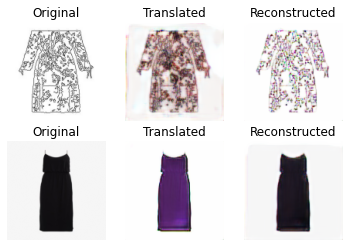

1/1 [==============================] - 0s 21ms/step


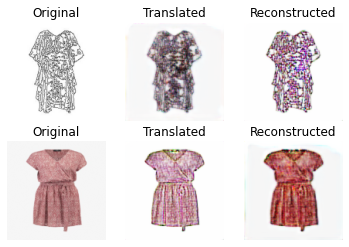

1/1 [==============================] - 0s 22ms/step


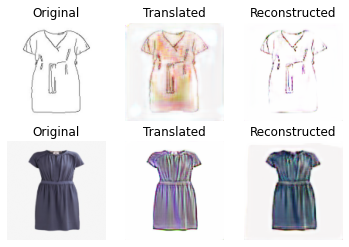

1/1 [==============================] - 0s 26ms/step


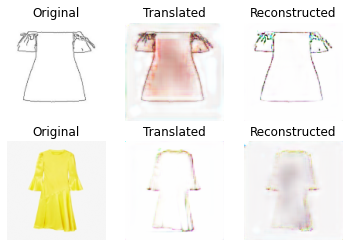

1/1 [==============================] - 0s 39ms/step


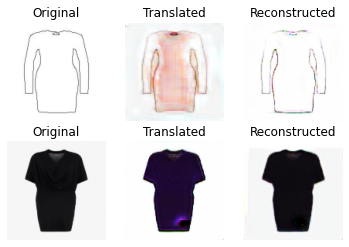

1/1 [==============================] - 0s 21ms/step


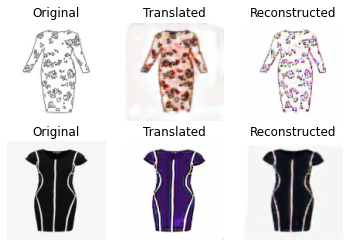

1/1 [==============================] - 0s 30ms/step


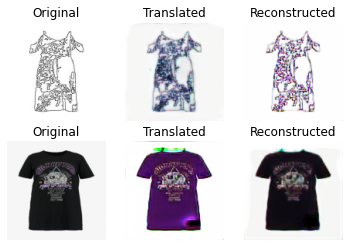

1/1 [==============================] - 0s 21ms/step


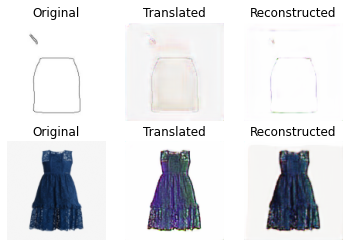

1/1 [==============================] - 0s 25ms/step


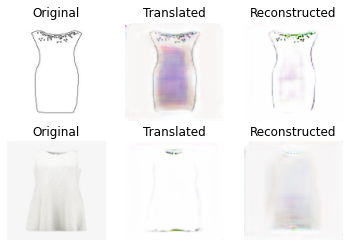

1/1 [==============================] - 0s 23ms/step


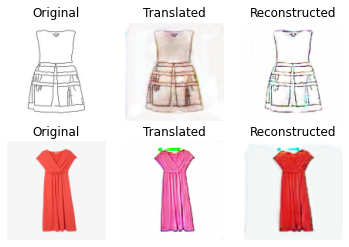

1/1 [==============================] - 0s 24ms/step


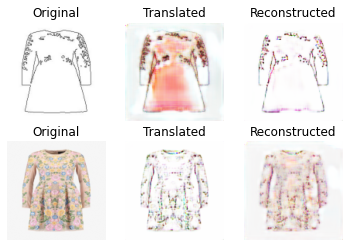

1/1 [==============================] - 0s 22ms/step


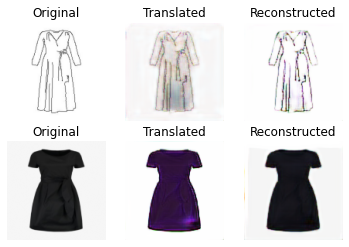

1/1 [==============================] - 0s 22ms/step


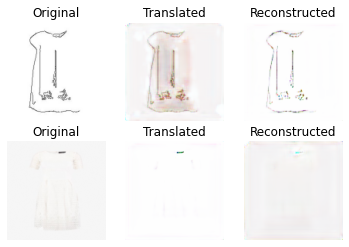

1/1 [==============================] - 0s 21ms/step


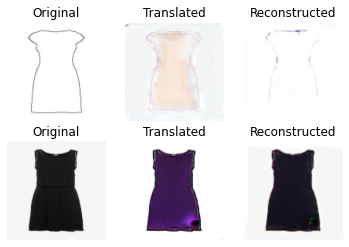

1/1 [==============================] - 0s 23ms/step


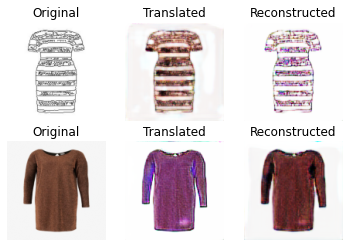

1/1 [==============================] - 0s 25ms/step


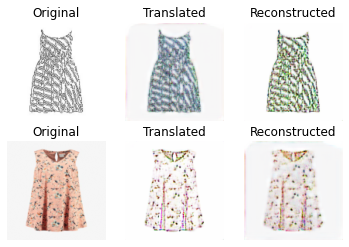

1/1 [==============================] - 0s 22ms/step


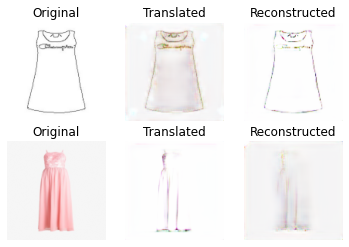

1/1 [==============================] - 0s 43ms/step


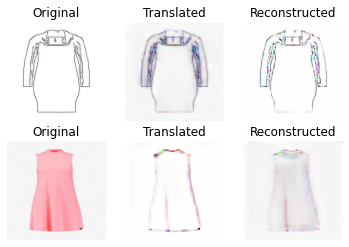

1/1 [==============================] - 0s 21ms/step


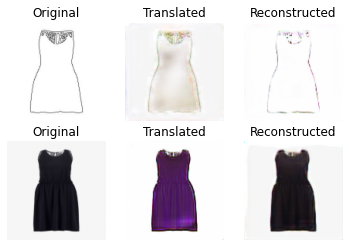

1/1 [==============================] - 0s 22ms/step


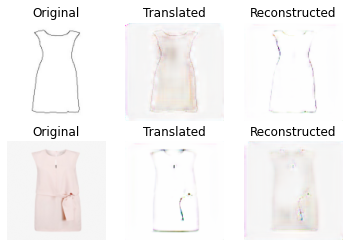

1/1 [==============================] - 0s 36ms/step


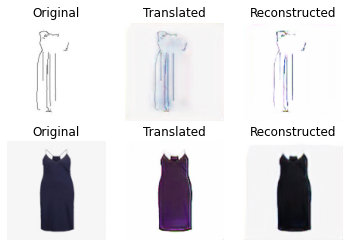

1/1 [==============================] - 0s 24ms/step


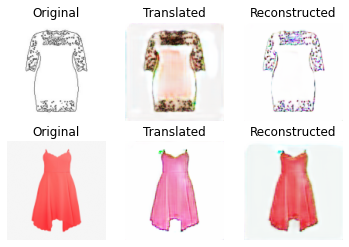

1/1 [==============================] - 0s 23ms/step


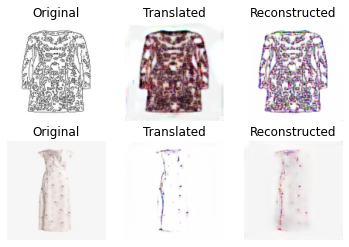

1/1 [==============================] - 0s 21ms/step


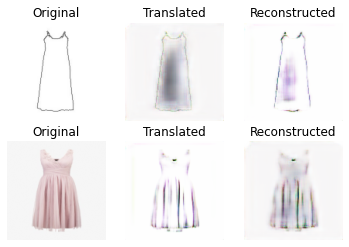

1/1 [==============================] - 0s 25ms/step


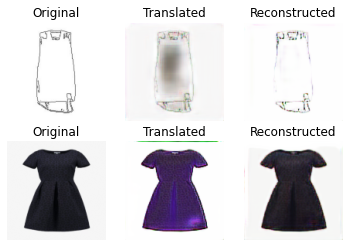

1/1 [==============================] - 0s 23ms/step


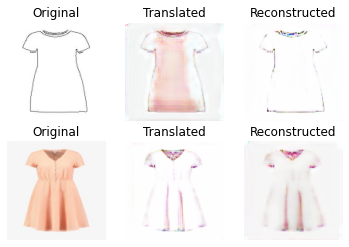

1/1 [==============================] - 0s 22ms/step


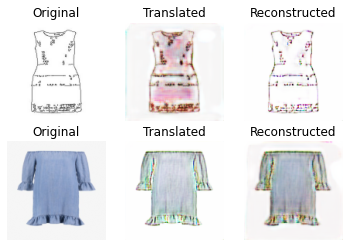

1/1 [==============================] - 0s 24ms/step


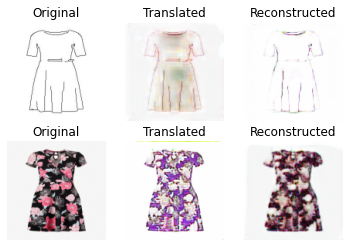

1/1 [==============================] - 0s 31ms/step


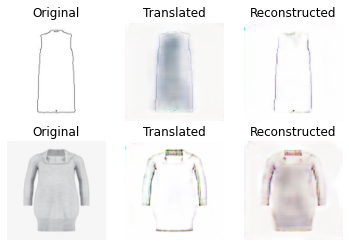

1/1 [==============================] - 0s 22ms/step


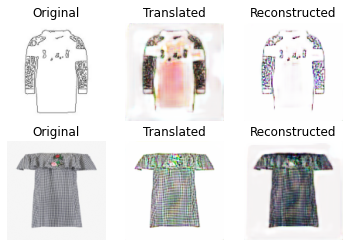

1/1 [==============================] - 0s 21ms/step


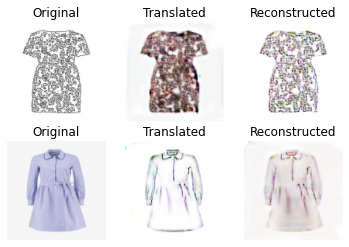

1/1 [==============================] - 0s 24ms/step


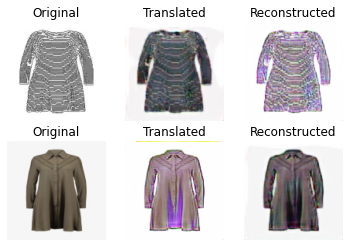

1/1 [==============================] - 0s 21ms/step


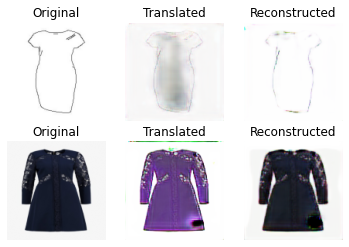

1/1 [==============================] - 0s 33ms/step


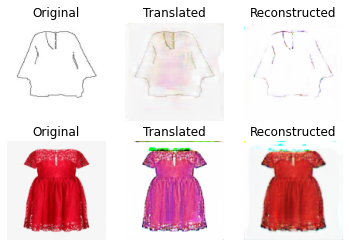

1/1 [==============================] - 0s 21ms/step


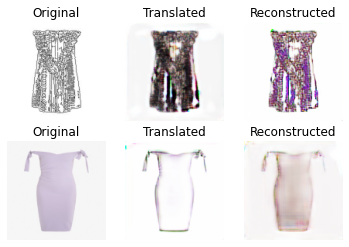

1/1 [==============================] - 0s 21ms/step


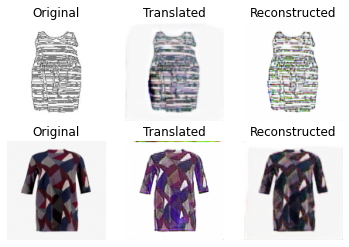

1/1 [==============================] - 0s 22ms/step


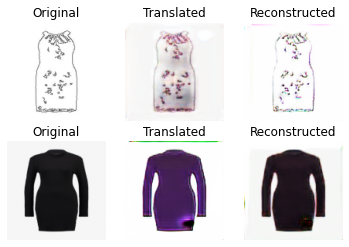

1/1 [==============================] - 0s 22ms/step


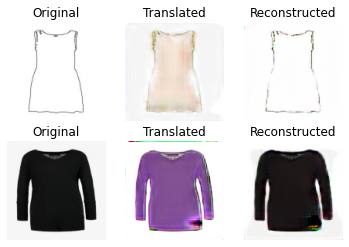

1/1 [==============================] - 0s 23ms/step


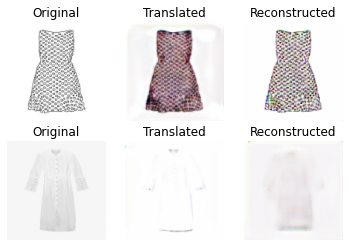

1/1 [==============================] - 0s 25ms/step


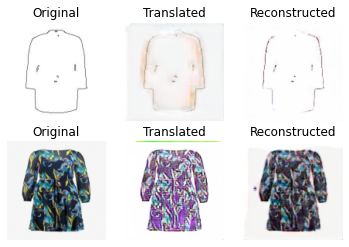

1/1 [==============================] - 0s 21ms/step


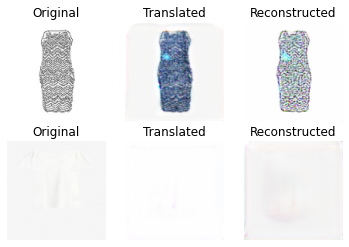

1/1 [==============================] - 0s 32ms/step


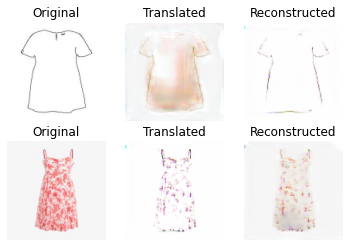

1/1 [==============================] - 0s 22ms/step


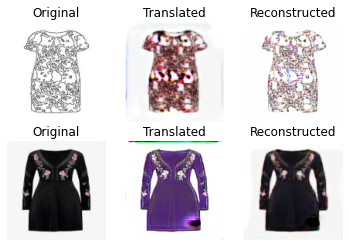

1/1 [==============================] - 0s 22ms/step


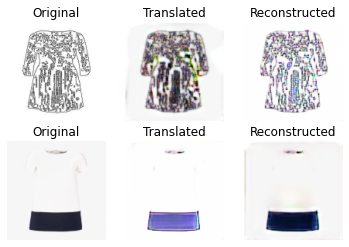

1/1 [==============================] - 0s 23ms/step


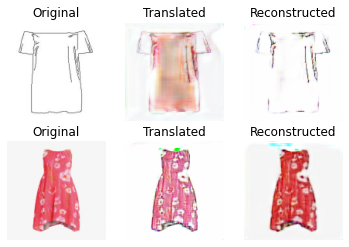

1/1 [==============================] - 0s 24ms/step


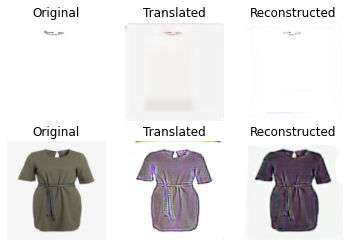

1/1 [==============================] - 0s 23ms/step


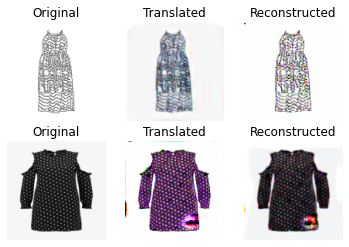

1/1 [==============================] - 0s 22ms/step


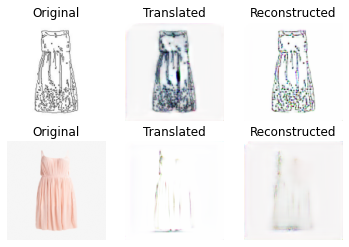

1/1 [==============================] - 0s 22ms/step


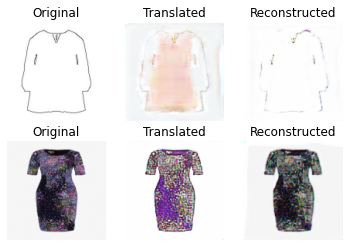

1/1 [==============================] - 0s 28ms/step


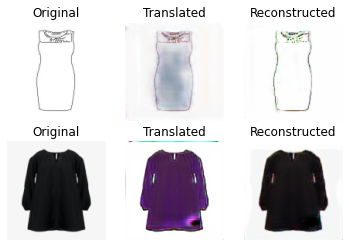

1/1 [==============================] - 0s 24ms/step


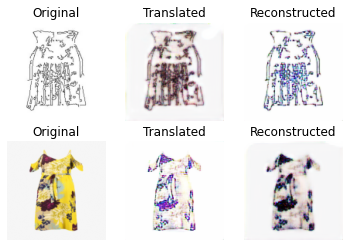

1/1 [==============================] - 0s 23ms/step


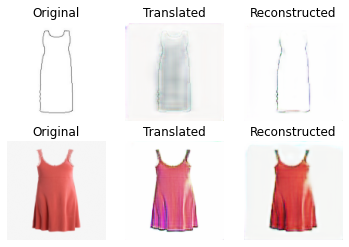

1/1 [==============================] - 0s 22ms/step


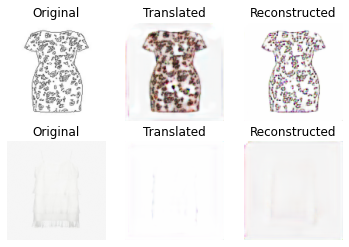

1/1 [==============================] - 0s 21ms/step


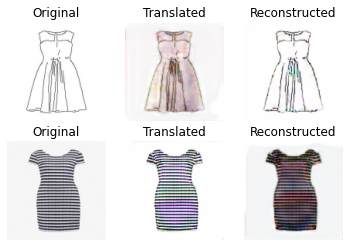

1/1 [==============================] - 0s 25ms/step


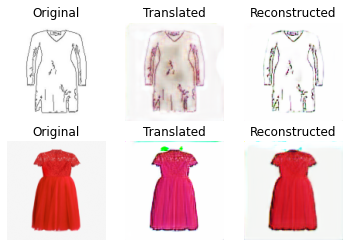

1/1 [==============================] - 0s 21ms/step


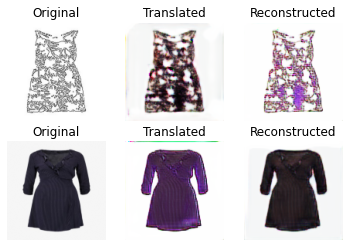

1/1 [==============================] - 0s 23ms/step


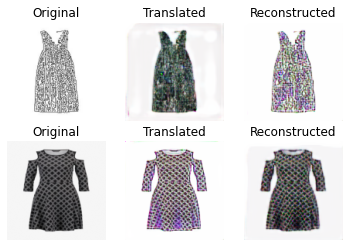

1/1 [==============================] - 0s 23ms/step


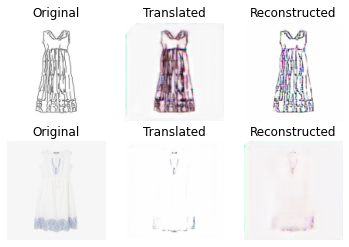

1/1 [==============================] - 0s 23ms/step


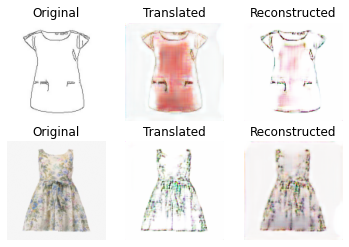

1/1 [==============================] - 0s 29ms/step


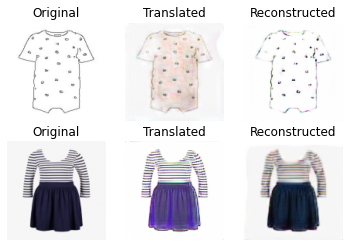

1/1 [==============================] - 0s 23ms/step


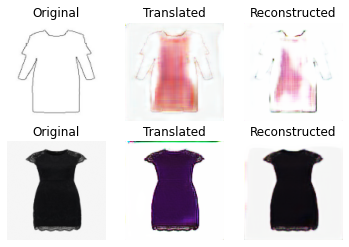

1/1 [==============================] - 0s 22ms/step


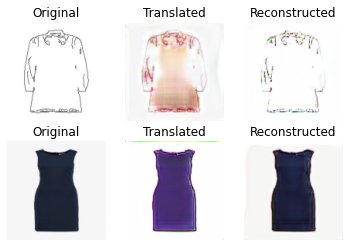

1/1 [==============================] - 0s 24ms/step


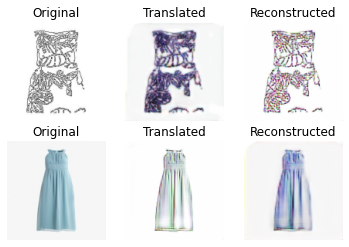

1/1 [==============================] - 0s 22ms/step


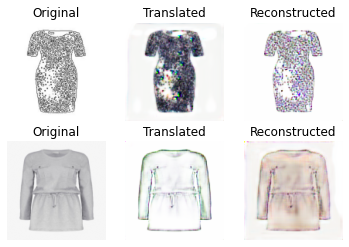

1/1 [==============================] - 0s 25ms/step


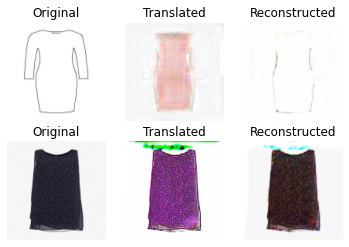

1/1 [==============================] - 0s 26ms/step


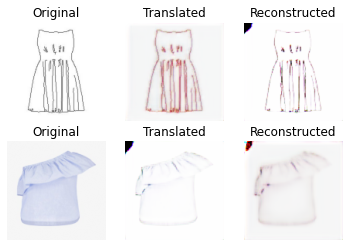

1/1 [==============================] - 0s 37ms/step


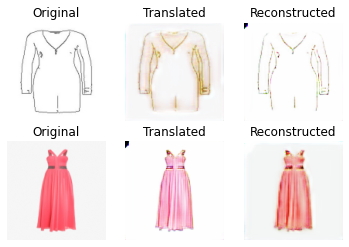

1/1 [==============================] - 0s 23ms/step


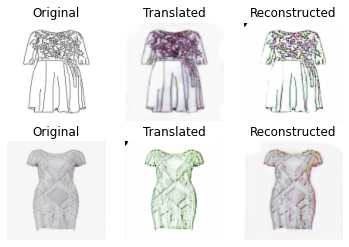

1/1 [==============================] - 0s 21ms/step


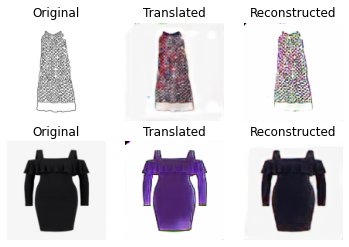

1/1 [==============================] - 0s 22ms/step


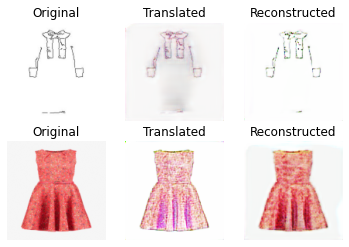

1/1 [==============================] - 0s 22ms/step


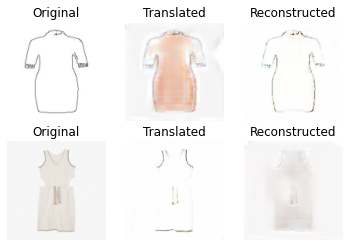

1/1 [==============================] - 0s 22ms/step


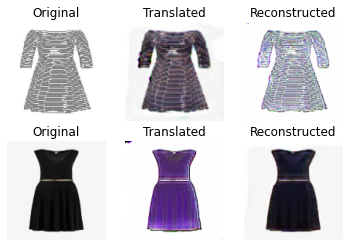

1/1 [==============================] - 0s 23ms/step


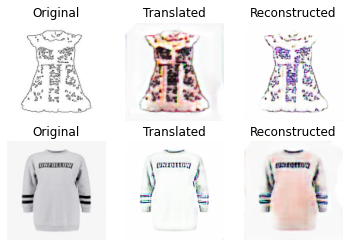

1/1 [==============================] - 0s 24ms/step


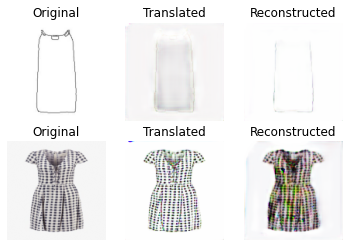

1/1 [==============================] - 0s 21ms/step


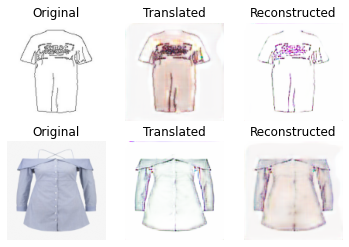

1/1 [==============================] - 0s 23ms/step


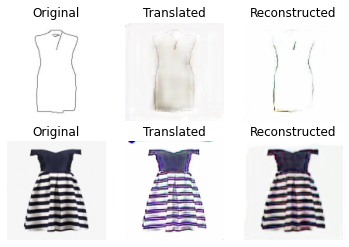

1/1 [==============================] - 0s 22ms/step


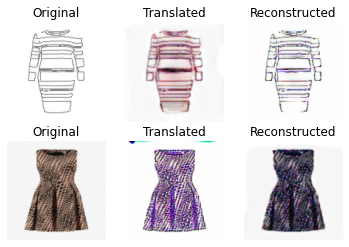

1/1 [==============================] - 0s 21ms/step


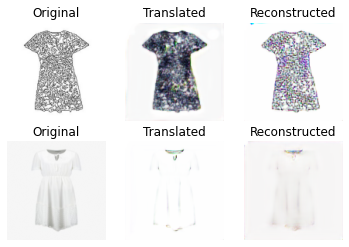

1/1 [==============================] - 0s 21ms/step


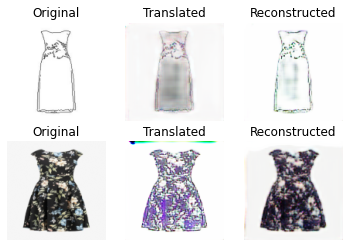

1/1 [==============================] - 0s 22ms/step


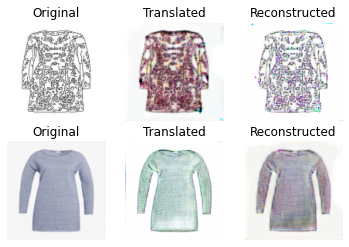

1/1 [==============================] - 0s 26ms/step


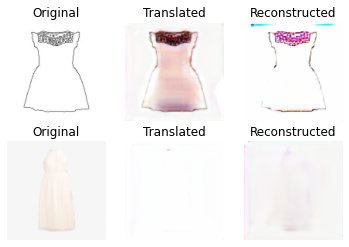

1/1 [==============================] - 0s 22ms/step


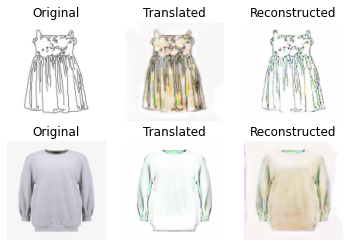

1/1 [==============================] - 0s 25ms/step


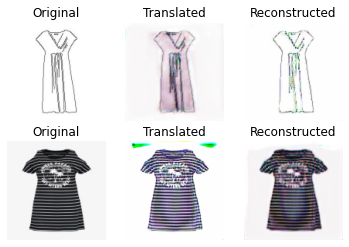

1/1 [==============================] - 0s 21ms/step


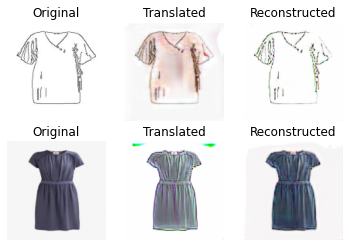

1/1 [==============================] - 0s 34ms/step


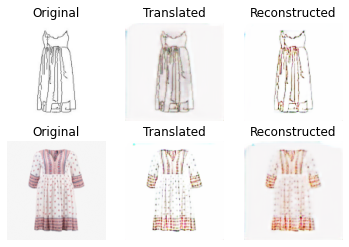

1/1 [==============================] - 0s 21ms/step


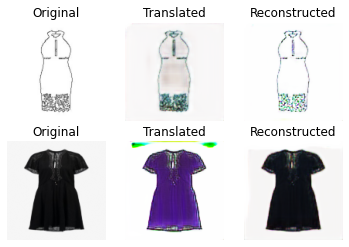

1/1 [==============================] - 0s 22ms/step


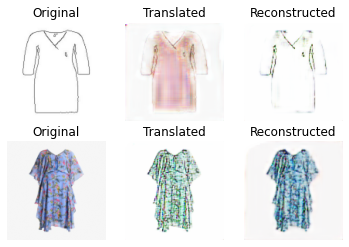

1/1 [==============================] - 0s 21ms/step


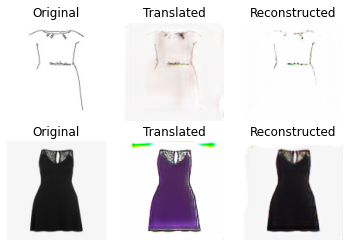

1/1 [==============================] - 0s 21ms/step


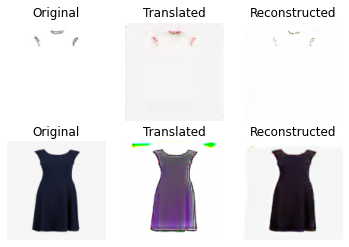

1/1 [==============================] - 0s 21ms/step


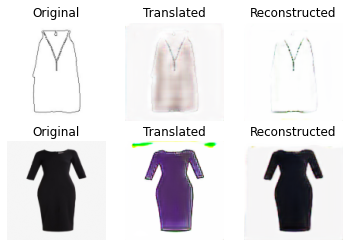

1/1 [==============================] - 0s 22ms/step


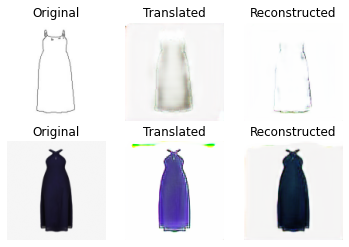

1/1 [==============================] - 0s 21ms/step


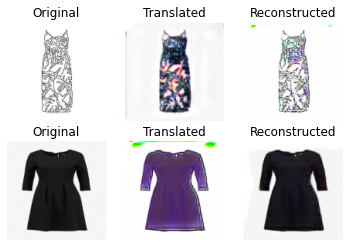

1/1 [==============================] - 0s 21ms/step


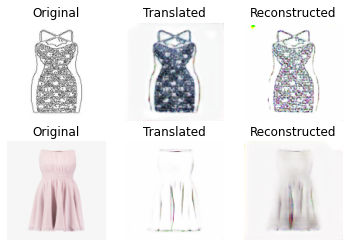

1/1 [==============================] - 0s 21ms/step


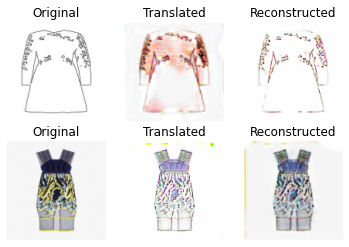

1/1 [==============================] - 0s 24ms/step


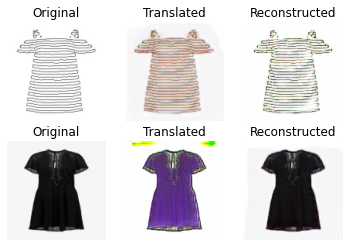

2/2 [==============================] - 0s 39ms/step


KeyboardInterrupt: ignored

In [37]:
cycle_generate = CycleGAN()
cycle_generate.train(epochs=100, batch_size=64, sample_interval=10)

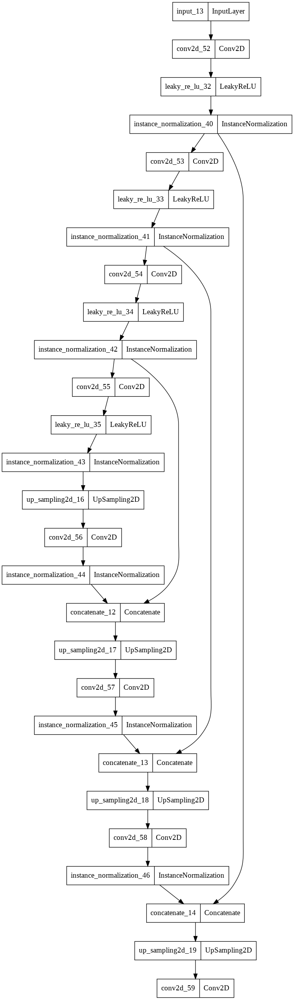

In [38]:
generator = cycle_generate.build_generator()

from tensorflow.keras.utils import plot_model
plot_model(generator)